# Importing packages

In [1]:
import sys
import os
import numpy as np
import pandas as pd

from PIL import Image                                       # Imaging and plotting packages
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from sklearn.model_selection import train_test_split        # Splitting data
from sklearn.preprocessing import LabelBinarizer

from tensorflow.keras.layers import Flatten                 # CNN model packages
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dropout
from tensorflow.keras.utils import normalize

# Importing data and processing for model

In [2]:
# moving to directory to import the data dataframe
%cd ..

C:\Users\63sha\OneDrive\Desktop\Springboard\Capstone_3


In [3]:
df = pd.read_csv('Data/Intermediate/data_df')    # reading in df

In [4]:
# Creating separate lists of the data needed

data = []
labels = []
bboxes = []

In [5]:
                                               # Filling lists with data from df
for i in range(len(df)):
    
    w = df.at[i,'width']
    h = df.at[i,'height']
    xmin_pct = float(df.at[i,'xmin'] / w)         # Finding the percentile for xy coordinates due to the change in size that 
    ymin_pct = float(df.at[i,'ymin'] / h)         # will occur with the images to input to model
    xmax_pct = float(df.at[i,'xmax'] / w)
    ymax_pct = float(df.at[i,'ymax'] / h)
    
    label = df.at[i,'class']                      # Class labels
    
    image = load_img(df.at[i,'im'], target_size=(224,224))  # Load and resize image
    image = img_to_array(image)                             # Convert image to numpy array
    
    data.append(image)
    labels.append(label)
    bboxes.append((xmin_pct,ymin_pct,xmax_pct,ymax_pct))    # Bounding box coordinates

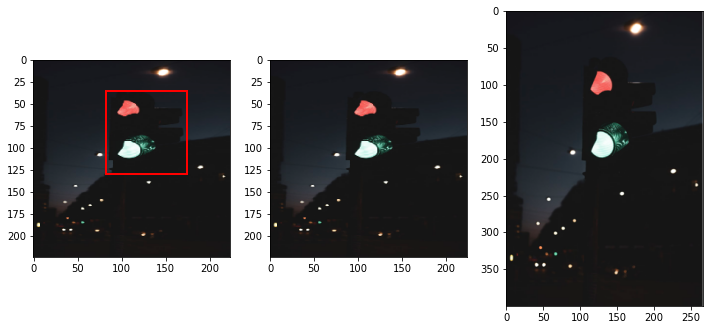

In [6]:
# Taking a look at our images before resizing and after with bounding box

fig,ax = plt.subplots(1,3,figsize=(12,8)) 

# Bounding box                                 
BB = patches.Rectangle((bboxes[0][0] *224,bboxes[0][1] *224), (bboxes[0][2] - bboxes[0][0])*224, \
                       (bboxes[0][3] - bboxes[0][1])*224 ,linewidth=2, edgecolor='r', facecolor='none' )

ax[0].imshow(data[0].astype('uint8'))      # Resized image
ax[0].add_patch(BB)                        # Bounding Box patch
ax[1].imshow(data[0].astype('uint8'))
ax[2].imshow(Image.open(df.loc[0,'im']))   # Original image
plt.show()

In [7]:
# normalize pixels from [0-255] to [0-1]
data = np.array(data, dtype="float32") / 255.0

# convert to np arrays
labels = np.array(labels)
bboxes = np.array(bboxes, dtype="float32")

# one-hot encoding the labels
lb = LabelBinarizer()
labels = lb.fit_transform(labels)

# Building a train, validation, and testing split

In [8]:
# test-train split 15%,85%
train_im,test_im,train_labels,test_labels,train_bb,test_bb = \
    train_test_split(data,labels,bboxes,test_size=0.15,random_state=63)

In [9]:
#  test-train split to get validation set 10%, 90%
train_im,val_im,train_labels,val_labels,train_bb,val_bb = \
    train_test_split(train_im,train_labels,train_bb, test_size =0.10, random_state=63)

# Creating and building our model and layers

In [10]:
#  creating a VGG16 model pretrained on imagenet
vgg = VGG16(weights="imagenet",
            include_top=False,              
            input_tensor=Input(shape=(224, 224, 3)))
# removing the last 3 dense layers so we can add our own to end of model
# specfying input size 

In [11]:
vgg.trainable = False       # We will use the pretrained weights as these weights have been trained on millions of images

In [12]:
flatten = vgg.output             # Creating variable for the output of our VGG layers
flatten = Flatten()(flatten)     # Flattening the initial output

In [13]:
bb1 = Dense(128, activation="relu")(flatten)    # Creating our own dense layers to predict the xy coordinates of the bouding box
bb2 = Dense(64, activation="relu")(bb1)         # Four dense layers gradually reducing neurons to 4 outputs for the corners of 
bb3 = Dense(32, activation="relu")(bb2)         # our bounding ox
bb4 = Dense(4, activation="sigmoid", name="bounding_box")(bb3)  # Bounding Box prediction

In [14]:
label1 = Dense(512, activation="relu")(flatten)     # Creating another set of layers to predict label of object
label_d1 = Dropout(0.5)(label1)                     # These layers consist of intertwined Dense and Dropout layers
label2 = Dense(512, activation="relu")(label_d1)
label_d2 = Dropout(0.5)(label2)
label3 = Dense(len(lb.classes_), activation="softmax", name="class_label")(label_d2)  # Class label prediction

# Initializing model and defining tuning metrics

In [15]:
#  Initializing our model and specifying the input and outputs
model = Model(         
    inputs=vgg.input,
    outputs=(bb4, label3))

In [16]:
INIT_LR = 1e-4          # Initial learning rate
NUM_EPOCHS = 25         # Number of training loops
BATCH_SIZE = 16         # Number of images processed before updating weights
OPT = Adam(INIT_LR)      # optimizer or algorithim to find best fit for data

In [17]:
losses = {
    "class_label": "categorical_crossentropy",      # Multiple categories being predicted
    "bounding_box": "mean_squared_error",           # Checking sqrt error of predicted from ground truth BB
}

lossWeights = {
    "class_label": 1.0,
    "bounding_box": 1.0
}
# Training Data
trainTargets = {
    "class_label": train_labels,                   
    "bounding_box": train_bb
}
# Testing Data
testTargets = {
    "class_label": val_labels,                     
    "bounding_box": val_bb
}

In [18]:
model.compile(loss=losses,                  # Compiling model with all created metrics
              optimizer=OPT, 
              metrics=["accuracy"], 
              loss_weights=lossWeights)

print(model.summary())                      # Getting a view of our complete model, connections, and parameters from layers

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

# Training Model

In [19]:
History = model.fit(                          # Fitting the created model to our data
    train_im, trainTargets,
    validation_data=(val_im, testTargets),
    batch_size=BATCH_SIZE,
    epochs=NUM_EPOCHS,
    verbose=1)

Epoch 1/25
42/42 [==============================] - 99s 2s/step - loss: 1.0725 - bounding_box_loss: 0.0194 - class_label_loss: 1.0531 - bounding_box_accuracy: 0.6090 - class_label_accuracy: 0.6806 - val_loss: 0.6908 - val_bounding_box_loss: 0.0184 - val_class_label_loss: 0.6724 - val_bounding_box_accuracy: 0.7733 - val_class_label_accuracy: 0.7467
Epoch 2/25
42/42 [==============================] - 110s 3s/step - loss: 0.7414 - bounding_box_loss: 0.0112 - class_label_loss: 0.7302 - bounding_box_accuracy: 0.7254 - class_label_accuracy: 0.7582 - val_loss: 0.6640 - val_bounding_box_loss: 0.0132 - val_class_label_loss: 0.6508 - val_bounding_box_accuracy: 0.8133 - val_class_label_accuracy: 0.7733
Epoch 3/25
42/42 [==============================] - 109s 3s/step - loss: 0.5760 - bounding_box_loss: 0.0072 - class_label_loss: 0.5688 - bounding_box_accuracy: 0.8104 - class_label_accuracy: 0.8164 - val_loss: 0.5451 - val_bounding_box_loss: 0.0125 - val_class_label_loss: 0.5325 - val_bounding_box_

42/42 [==============================] - 109s 3s/step - loss: 0.0272 - bounding_box_loss: 3.2364e-04 - class_label_loss: 0.0269 - bounding_box_accuracy: 0.9612 - class_label_accuracy: 0.9970 - val_loss: 0.4317 - val_bounding_box_loss: 0.0119 - val_class_label_loss: 0.4198 - val_bounding_box_accuracy: 0.8533 - val_class_label_accuracy: 0.8933
Epoch 25/25
42/42 [==============================] - 109s 3s/step - loss: 0.0186 - bounding_box_loss: 3.3183e-04 - class_label_loss: 0.0183 - bounding_box_accuracy: 0.9448 - class_label_accuracy: 0.9955 - val_loss: 0.4256 - val_bounding_box_loss: 0.0129 - val_class_label_loss: 0.4127 - val_bounding_box_accuracy: 0.8267 - val_class_label_accuracy: 0.8933


# Saving  trained model

In [20]:
model.save("Models/VGG_model/VGG16_model", save_format='h5')   # Saving trained model   

# Visuals of the loss and Accuracy of our model

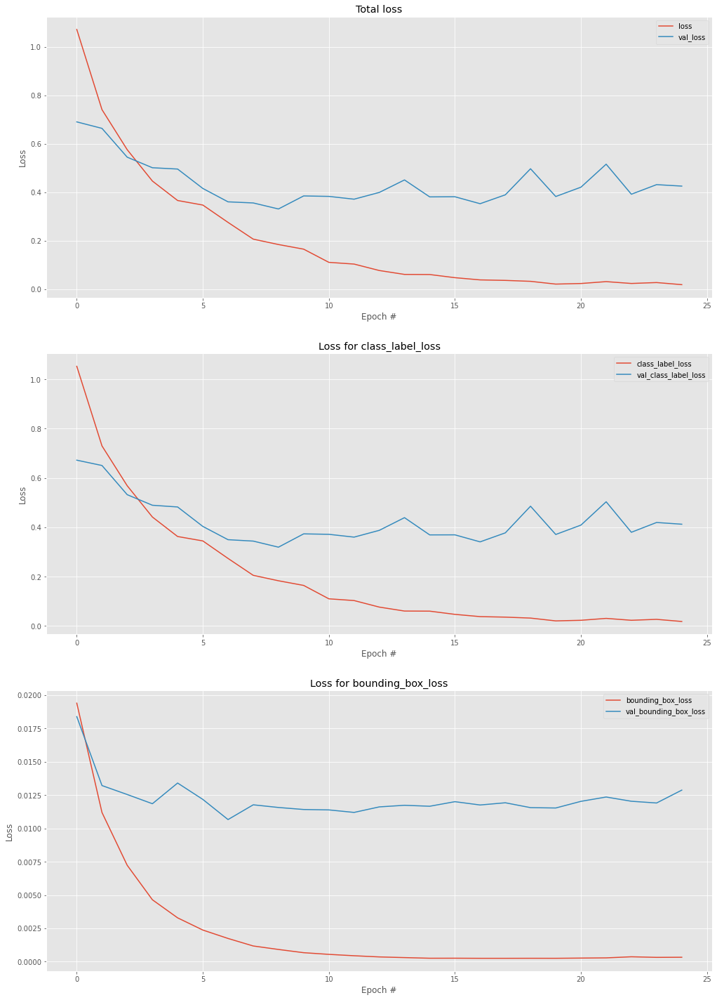

In [22]:
lossNames = ["loss", 
             "class_label_loss", 
             "bounding_box_loss"]

N = np.arange(0, NUM_EPOCHS)
plt.style.use("ggplot")
(fig, ax) = plt.subplots(3, 1, figsize=(17, 25))

# plotting the loss for training and validation data

for (i, l) in enumerate(lossNames):
    title = "Loss for {}".format(l) if l != "loss" else "Total loss"
    ax[i].set_title(title)
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Loss")
    ax[i].plot(N, History.history[l], label=l)
    ax[i].plot(N, History.history["val_" + l], label="val_" + l)
    ax[i].legend()

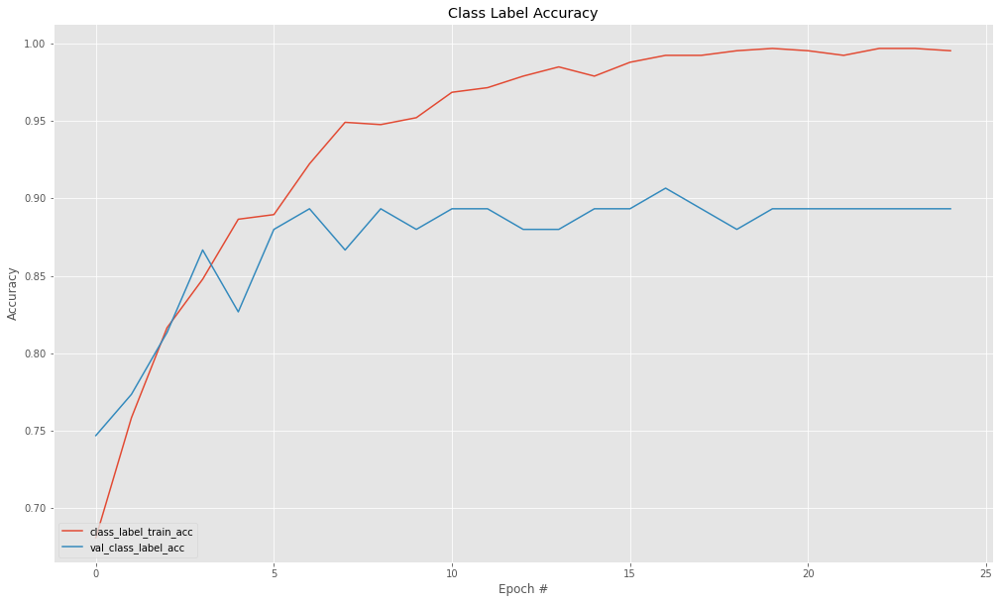

In [23]:
# Accuracy plots for class labels
plt.style.use("ggplot")
plt.figure(figsize=(17, 10))

plt.plot(N, History.history["class_label_accuracy"],
         label="class_label_train_acc")
plt.plot(N, History.history["val_class_label_accuracy"],
         label="val_class_label_acc")

plt.title("Class Label Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower left")

# save the label accuracy plot
plotPath = os.path.sep.join(["Models/VGG_model/acc_label.png"])
plt.savefig(plotPath)

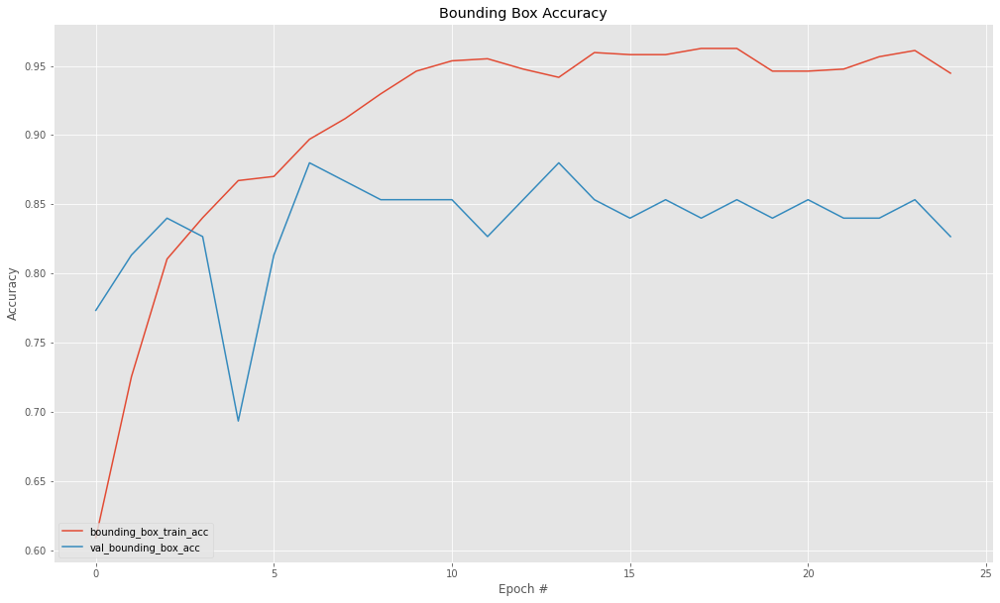

In [24]:
# Plotting Bounding box accuracy
plt.style.use("ggplot")
plt.figure(figsize=(17, 10))

plt.plot(N, History.history["bounding_box_accuracy"],
         label="bounding_box_train_acc")
plt.plot(N, History.history["val_bounding_box_accuracy"],
         label="val_bounding_box_acc")

plt.title("Bounding Box Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower left")

# save the  BB accuracies plot
plotPath = os.path.sep.join(["Models/VGG_model/acc_bbox.png"])
plt.savefig(plotPath)


# Using our model on test data to make predictions 

1/1 [==============================] - 0s 129ms/step


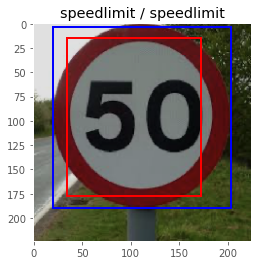

1/1 [==============================] - 0s 114ms/step


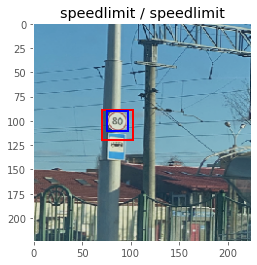

1/1 [==============================] - 0s 130ms/step


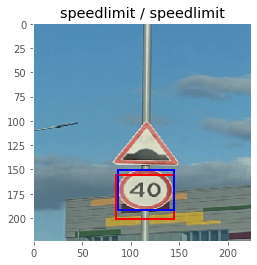

1/1 [==============================] - 0s 130ms/step


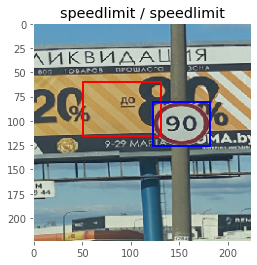

1/1 [==============================] - 0s 128ms/step


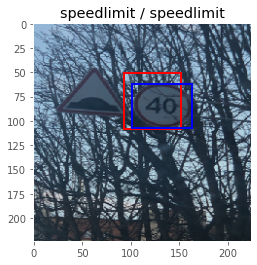

1/1 [==============================] - 0s 132ms/step


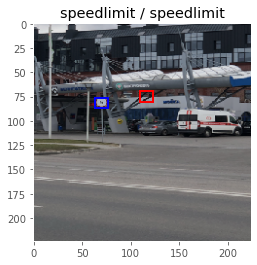

1/1 [==============================] - 0s 150ms/step


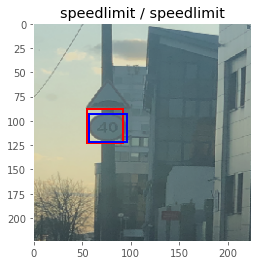

1/1 [==============================] - 0s 139ms/step


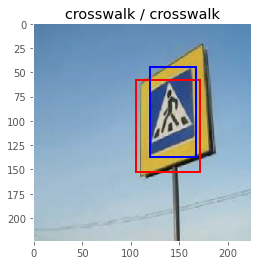

1/1 [==============================] - 0s 148ms/step


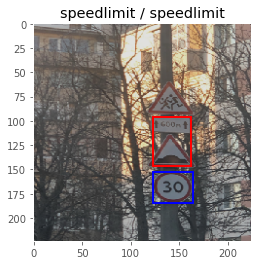

1/1 [==============================] - 0s 150ms/step


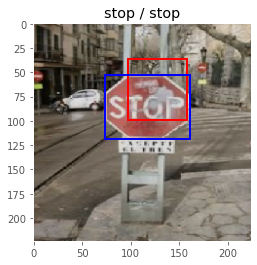

1/1 [==============================] - 0s 147ms/step


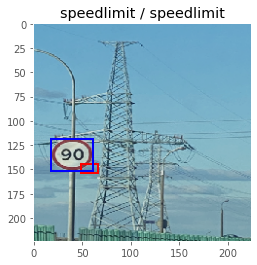

1/1 [==============================] - 0s 140ms/step


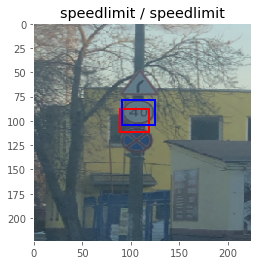

1/1 [==============================] - 0s 132ms/step


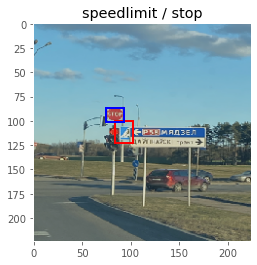

1/1 [==============================] - 0s 146ms/step


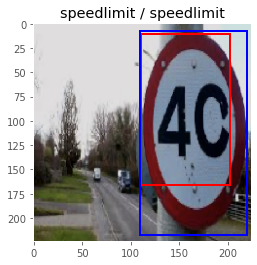

1/1 [==============================] - 0s 138ms/step


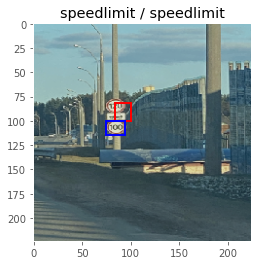

1/1 [==============================] - 0s 146ms/step


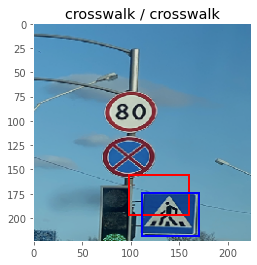

1/1 [==============================] - 0s 119ms/step


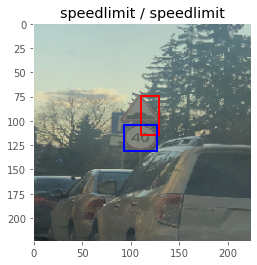

1/1 [==============================] - 0s 131ms/step


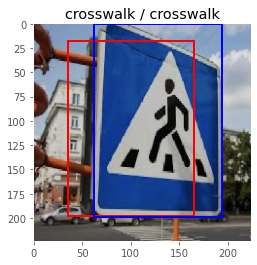

1/1 [==============================] - 0s 134ms/step


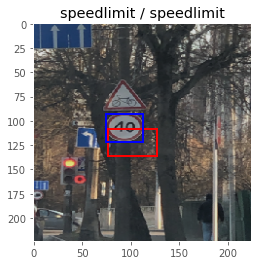

1/1 [==============================] - 0s 127ms/step


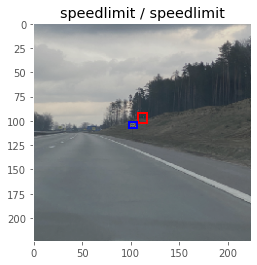

1/1 [==============================] - 0s 139ms/step


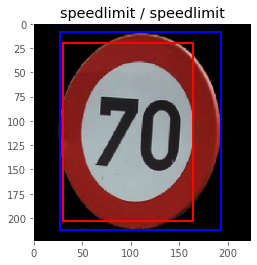

1/1 [==============================] - 0s 137ms/step


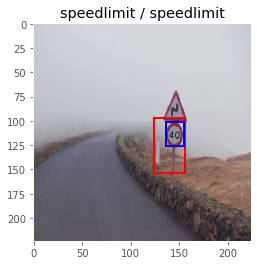

1/1 [==============================] - 0s 138ms/step


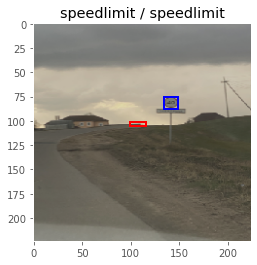

1/1 [==============================] - 0s 126ms/step


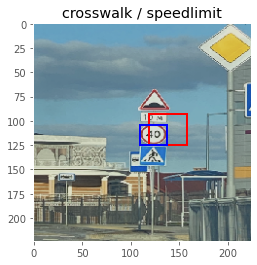

1/1 [==============================] - 0s 136ms/step


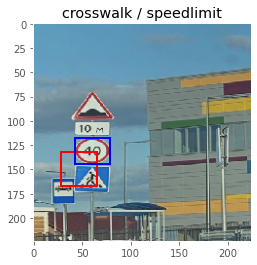

1/1 [==============================] - 0s 152ms/step


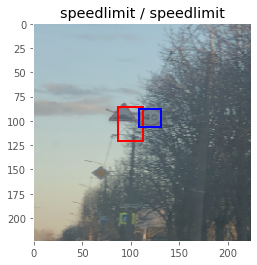

1/1 [==============================] - 0s 115ms/step


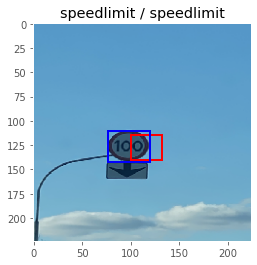

1/1 [==============================] - 0s 150ms/step


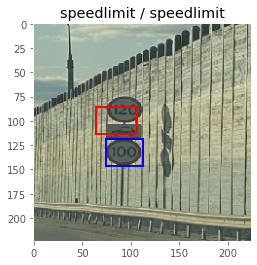

1/1 [==============================] - 0s 126ms/step


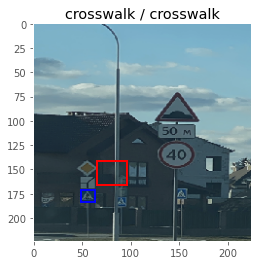

1/1 [==============================] - 0s 129ms/step


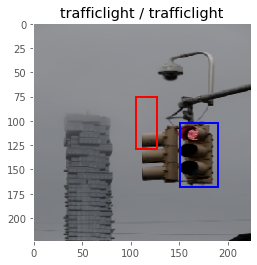

1/1 [==============================] - 0s 144ms/step


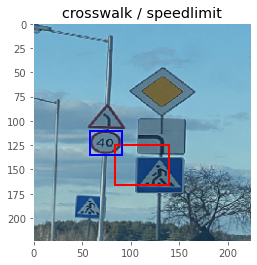

1/1 [==============================] - 0s 150ms/step


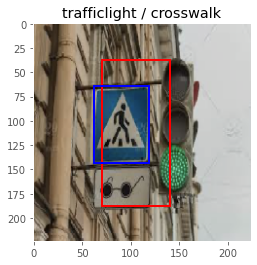

1/1 [==============================] - 0s 132ms/step


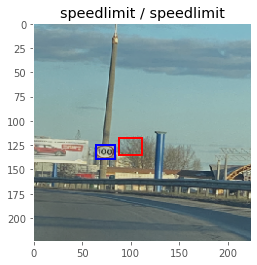

1/1 [==============================] - 0s 130ms/step


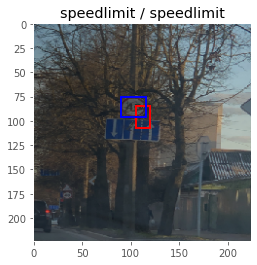

1/1 [==============================] - 0s 137ms/step


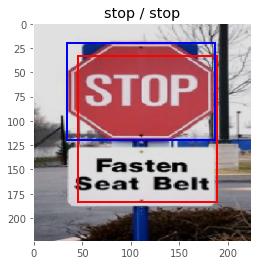

1/1 [==============================] - 0s 143ms/step


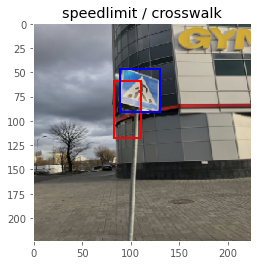

1/1 [==============================] - 0s 134ms/step


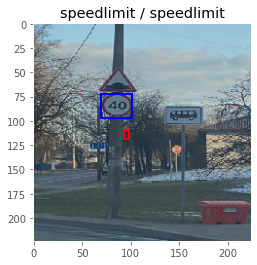

1/1 [==============================] - 0s 127ms/step


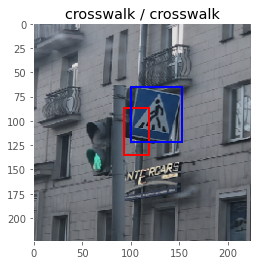

1/1 [==============================] - 0s 131ms/step


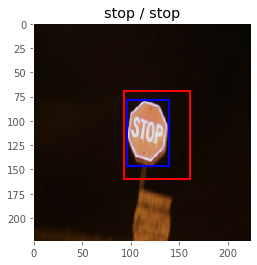

1/1 [==============================] - 0s 121ms/step


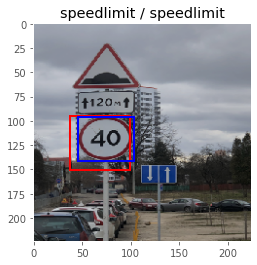

1/1 [==============================] - 0s 130ms/step


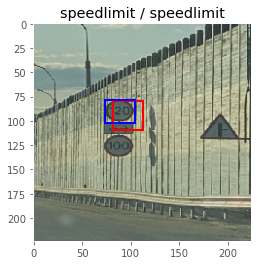

1/1 [==============================] - 0s 126ms/step


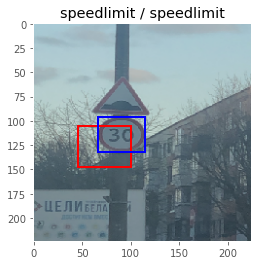

1/1 [==============================] - 0s 128ms/step


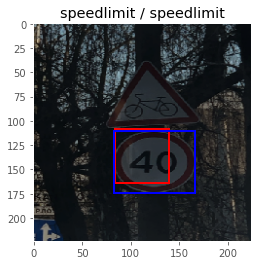

1/1 [==============================] - 0s 141ms/step


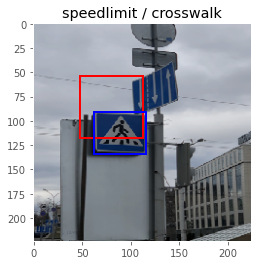

1/1 [==============================] - 0s 137ms/step


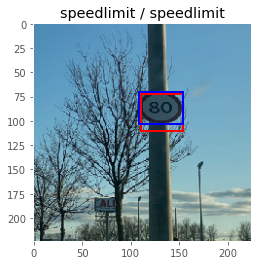

1/1 [==============================] - 0s 126ms/step


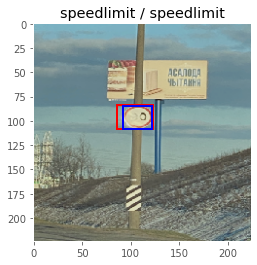

1/1 [==============================] - 0s 123ms/step


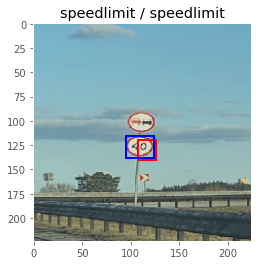

1/1 [==============================] - 0s 128ms/step


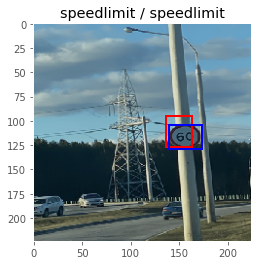

1/1 [==============================] - 0s 119ms/step


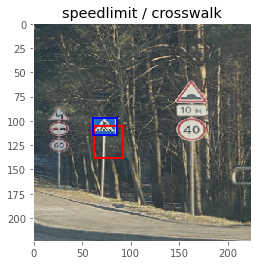

1/1 [==============================] - 0s 132ms/step


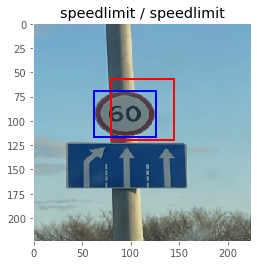

1/1 [==============================] - 0s 131ms/step


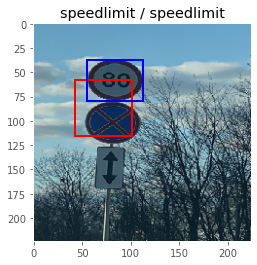

1/1 [==============================] - 0s 134ms/step


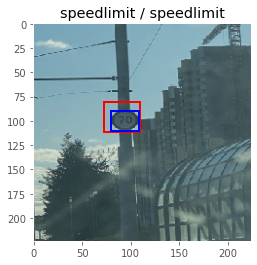

1/1 [==============================] - 0s 136ms/step


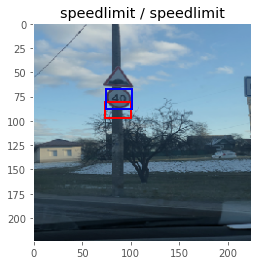

1/1 [==============================] - 0s 135ms/step


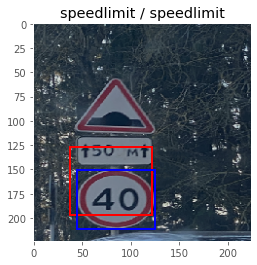

1/1 [==============================] - 0s 134ms/step


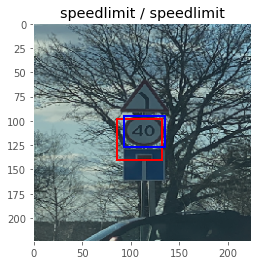

1/1 [==============================] - 0s 128ms/step


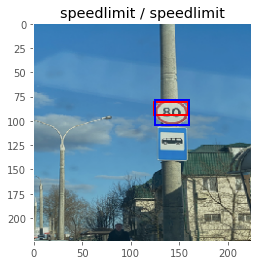

1/1 [==============================] - 0s 127ms/step


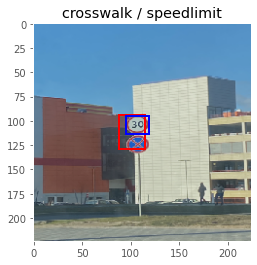

1/1 [==============================] - 0s 126ms/step


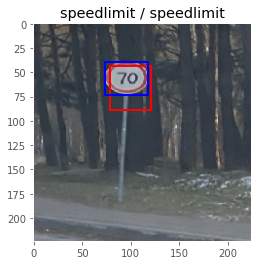

1/1 [==============================] - 0s 133ms/step


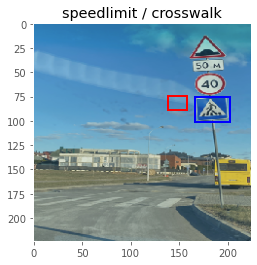

1/1 [==============================] - 0s 134ms/step


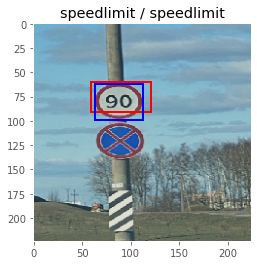

1/1 [==============================] - 0s 142ms/step


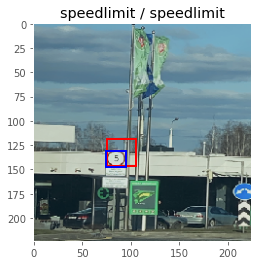

1/1 [==============================] - 0s 125ms/step


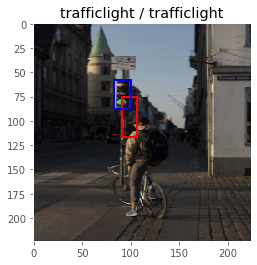

1/1 [==============================] - 0s 132ms/step


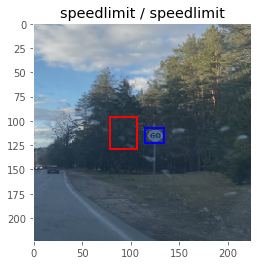

1/1 [==============================] - 0s 139ms/step


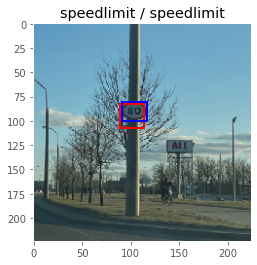

1/1 [==============================] - 0s 132ms/step


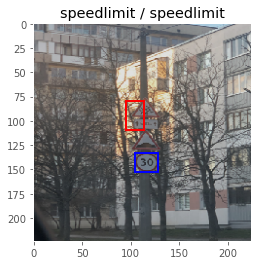

1/1 [==============================] - 0s 136ms/step


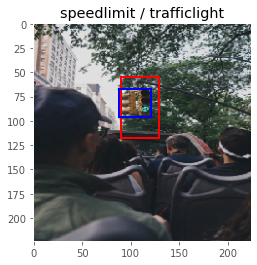

1/1 [==============================] - 0s 142ms/step


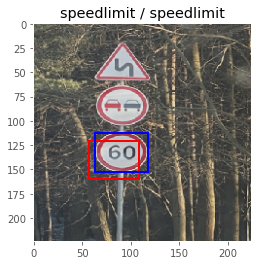

1/1 [==============================] - 0s 143ms/step


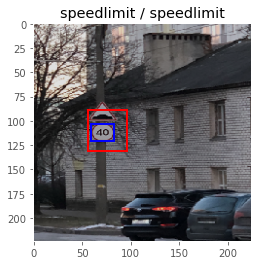

1/1 [==============================] - 0s 139ms/step


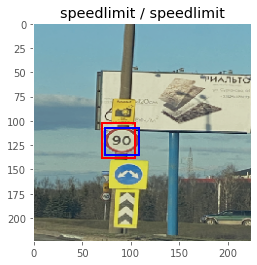

1/1 [==============================] - 0s 172ms/step


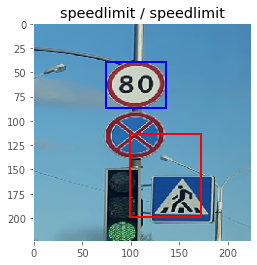

1/1 [==============================] - 0s 149ms/step


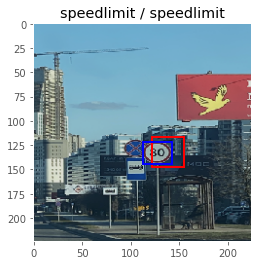

1/1 [==============================] - 0s 142ms/step


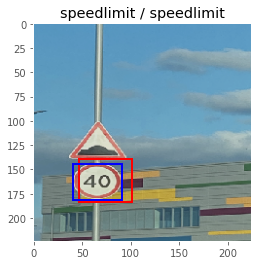

1/1 [==============================] - 0s 122ms/step


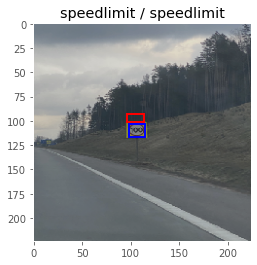

1/1 [==============================] - 0s 147ms/step


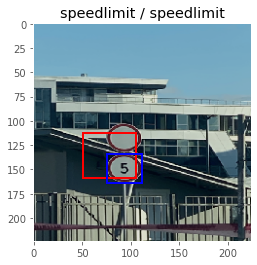

1/1 [==============================] - 0s 130ms/step


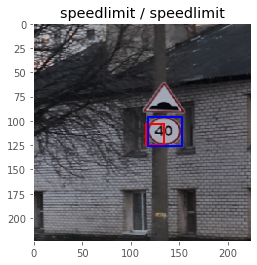

1/1 [==============================] - 0s 137ms/step


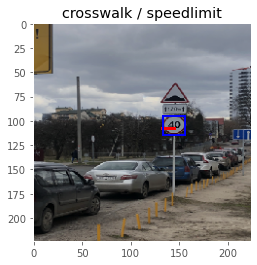

1/1 [==============================] - 0s 145ms/step


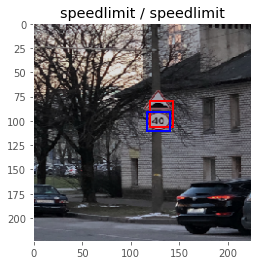

1/1 [==============================] - 0s 126ms/step


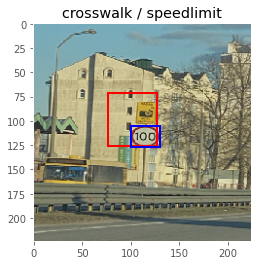

1/1 [==============================] - 0s 141ms/step


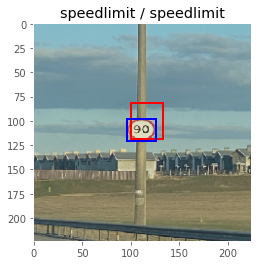

1/1 [==============================] - 0s 144ms/step


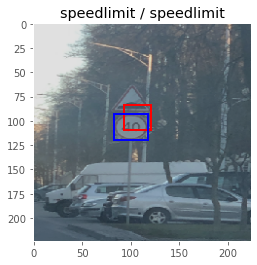

1/1 [==============================] - 0s 128ms/step


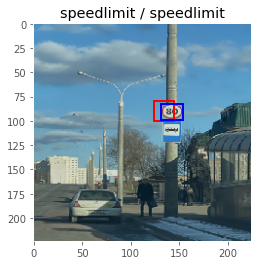

1/1 [==============================] - 0s 133ms/step


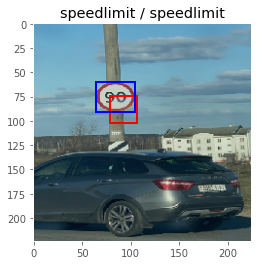

1/1 [==============================] - 0s 125ms/step


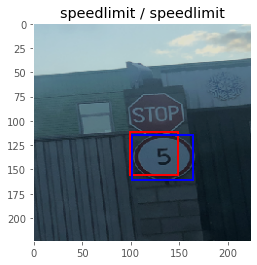

1/1 [==============================] - 0s 123ms/step


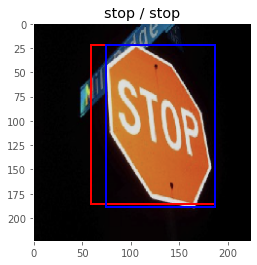

1/1 [==============================] - 0s 124ms/step


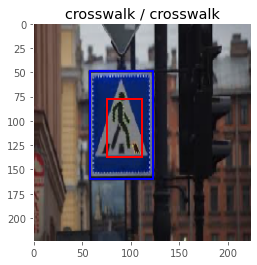

1/1 [==============================] - 0s 125ms/step


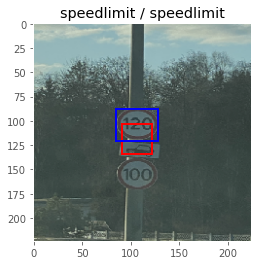

1/1 [==============================] - 0s 121ms/step


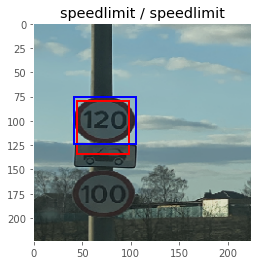

1/1 [==============================] - 0s 141ms/step


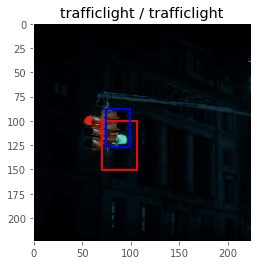

1/1 [==============================] - 0s 132ms/step


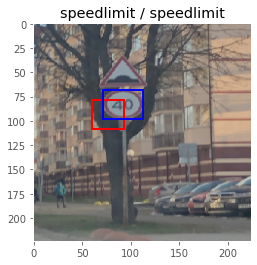

1/1 [==============================] - 0s 135ms/step


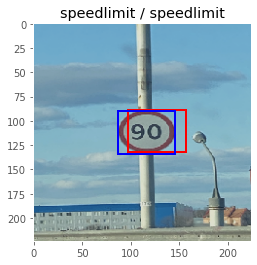

1/1 [==============================] - 0s 122ms/step


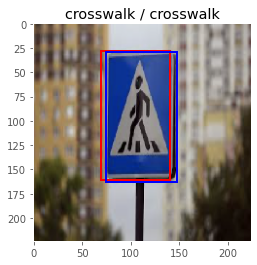

1/1 [==============================] - 0s 145ms/step


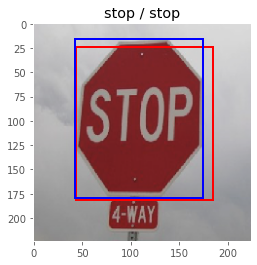

1/1 [==============================] - 0s 126ms/step


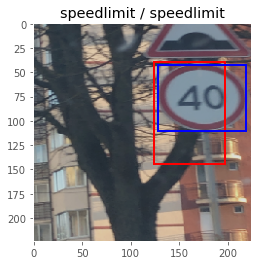

1/1 [==============================] - 0s 122ms/step


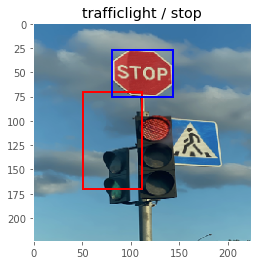

1/1 [==============================] - 0s 130ms/step


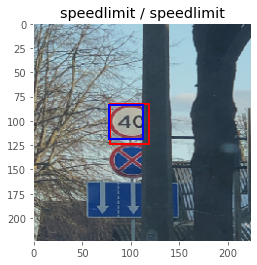

1/1 [==============================] - 0s 131ms/step


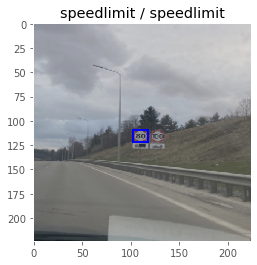

1/1 [==============================] - 0s 136ms/step


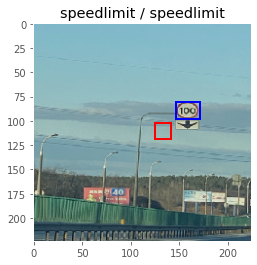

1/1 [==============================] - 0s 129ms/step


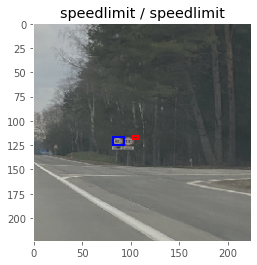

1/1 [==============================] - 0s 130ms/step


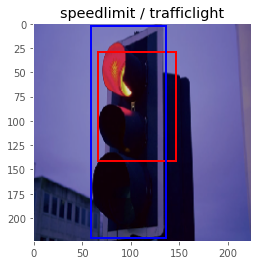

1/1 [==============================] - 0s 123ms/step


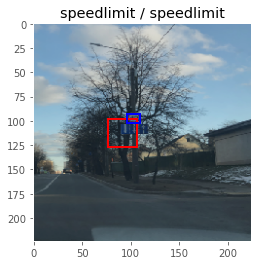

1/1 [==============================] - 0s 125ms/step


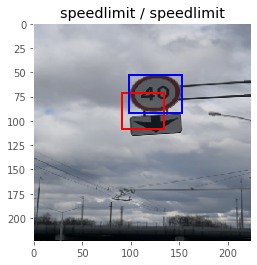

1/1 [==============================] - 0s 120ms/step


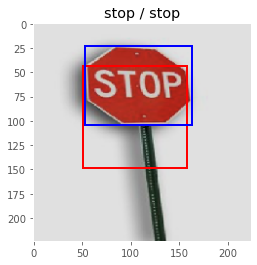

1/1 [==============================] - 0s 136ms/step


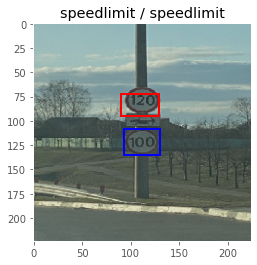

1/1 [==============================] - 0s 129ms/step


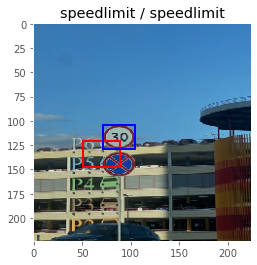

1/1 [==============================] - 0s 128ms/step


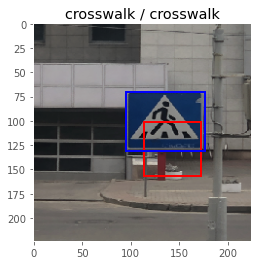

1/1 [==============================] - 0s 131ms/step


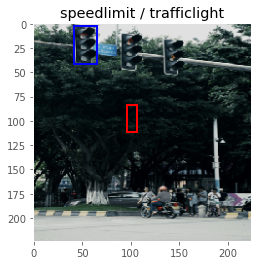

1/1 [==============================] - 0s 126ms/step


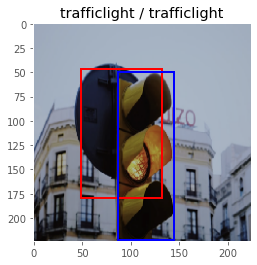

1/1 [==============================] - 0s 131ms/step


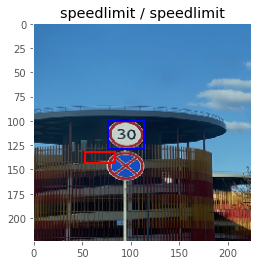

1/1 [==============================] - 0s 123ms/step


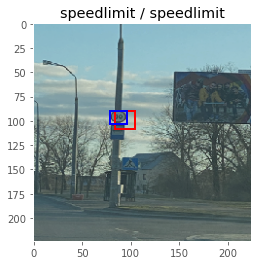

1/1 [==============================] - 0s 136ms/step


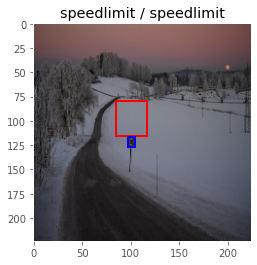

1/1 [==============================] - 0s 134ms/step


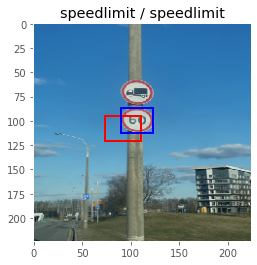

1/1 [==============================] - 0s 128ms/step


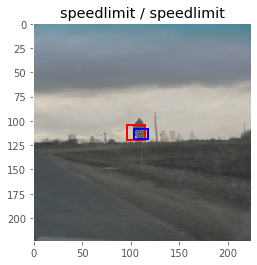

1/1 [==============================] - 0s 126ms/step


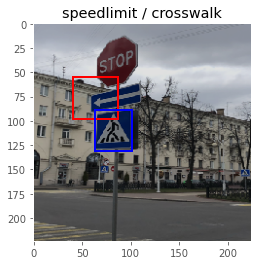

1/1 [==============================] - 0s 134ms/step


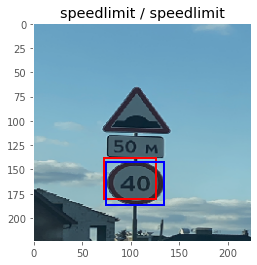

1/1 [==============================] - 0s 126ms/step


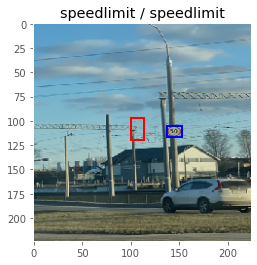

1/1 [==============================] - 0s 130ms/step


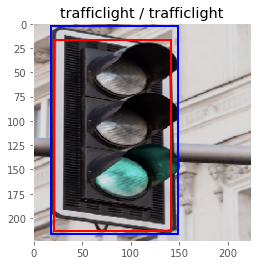

1/1 [==============================] - 0s 127ms/step


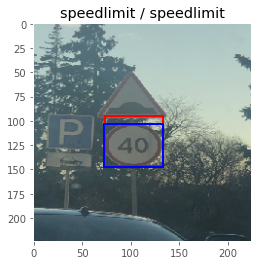

1/1 [==============================] - 0s 124ms/step


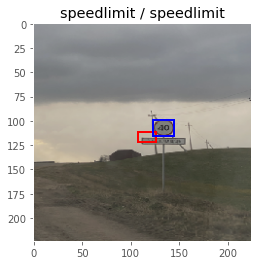

1/1 [==============================] - 0s 136ms/step


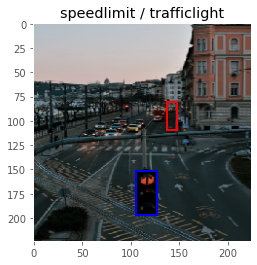

1/1 [==============================] - 0s 125ms/step


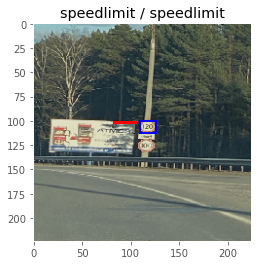

1/1 [==============================] - 0s 128ms/step


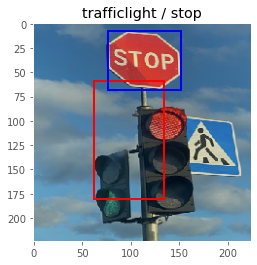

1/1 [==============================] - 0s 139ms/step


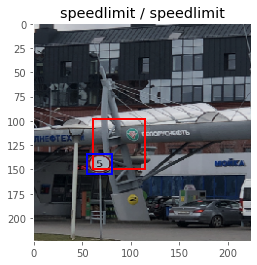

1/1 [==============================] - 0s 134ms/step


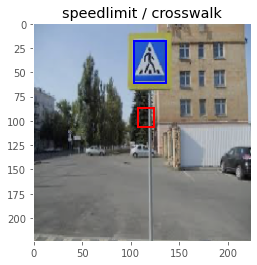

1/1 [==============================] - 0s 136ms/step


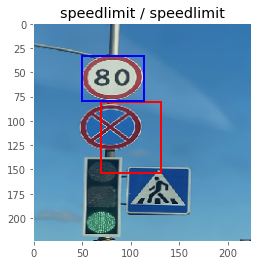

1/1 [==============================] - 0s 142ms/step


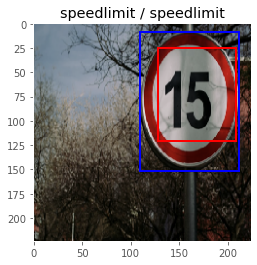

1/1 [==============================] - 0s 135ms/step


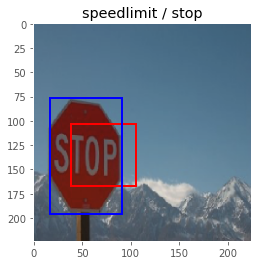

1/1 [==============================] - 0s 140ms/step


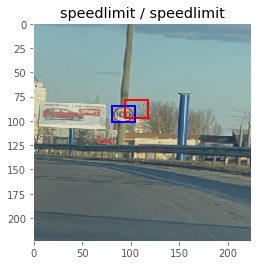

1/1 [==============================] - 0s 157ms/step


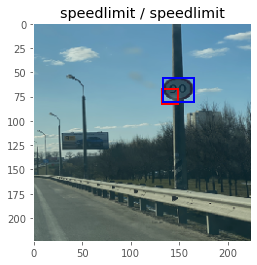

1/1 [==============================] - 0s 145ms/step


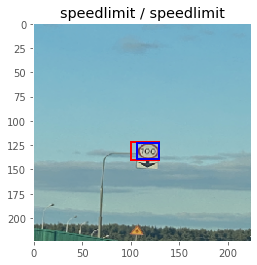

1/1 [==============================] - 0s 150ms/step


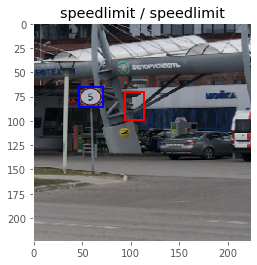

1/1 [==============================] - 0s 131ms/step


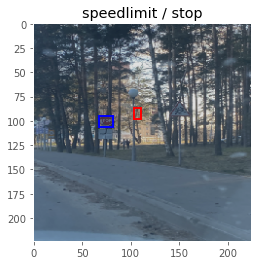

1/1 [==============================] - 0s 143ms/step


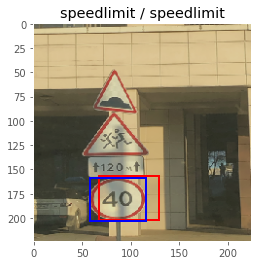

In [27]:
counter = 0                                                  # Counter to sum incorrect labels     

for i, image in enumerate(test_im):                          # Looping over our test data
    model_image = np.expand_dims(image, axis=0)

                                                             # predicting bbox and label
    (boxPreds, labelPreds) = model.predict(model_image)
    (startX, startY, endX, endY) = boxPreds[0]

                                                             # finding class label with highest pred. probability
    l = np.argmax(labelPreds, axis=1)
    label = lb.classes_[l][0]
    image_pixels = image * 224                               # giving our pixels the correct range from 0-255
    fig,ax = plt.subplots()
    
    # Creating our predicted bounding box
    BB = patches.Rectangle((startX *224,startY *224), (endX - startX)*224, \
                           (endY - startY)*224 ,linewidth=2, edgecolor='r', facecolor='none' )
    
    # Creating our ground truth bounding box
    GT_bb = patches.Rectangle((test_bb[i,0] *224,test_bb[i,1] *224), (test_bb[i,2] - test_bb[i,0])*224, \
                              (test_bb[i,3] - test_bb[i,1])*224 ,linewidth=2, edgecolor='blue', facecolor='none' )
    
    ax.imshow(image_pixels.astype('uint8'))                  # show image
    ax.grid(False)
    ax.add_patch(BB)                                         # add predicted box
    ax.add_patch(GT_bb)                                      # add true box
    t_label = lb.classes_[np.argmax(test_labels[i])]         # create true label
    ax.set_title(str(label) + ' / ' + str(t_label))          # add labels above image and side by side for accuracy check
    if str(label) != str(t_label):                           # Count the images labeled incorrectly
        counter+=1
    plt.show()                                               # show our predictions over the image
    

In [28]:
# Finding the Accuracy percentage on our testing data
print(counter)
print(len(test_im))
test_acc = 1-(counter / len(test_im))
print(test_acc)

22
132
0.8333333333333334


### _Our performance fell a bit between the validation and testing data. Overall, I believe this model is performing well and we may be able to acquire better performance from it by adjusting our learning rate, batch size , and epochs run on the training set._
### _As we see from some of the test images, our performance may be mostly hindered by the images we are working with. Several bounding boxes were mispredicted due to many road signs of the same class and labels were wrong due to the detection of other sign types in the image. Our next test model will be a YOLO  neural network model for image processing that segments our images into several objects, classifies the object and is able to create several bounding boxes for the objects detected_ 